# Import Modules

In [ ]:
pip install git+https://www.github.com/keras-team/keras-contrib.git

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

In [ ]:
import cv2
from google.colab import files

import numpy as np
import skimage.exposure as exposure
from google.colab.patches import cv2_imshow
import os

from google.colab import drive
from google.colab import auth
from oauth2client.client import GoogleCredentials

import shutil

import math
import numpy as np
import itertools
import pandas as pd



In [ ]:
import glob
import datetime
from typing import AnyStr, Any, Callable

%matplotlib inline

import cv2
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import clear_output

import tensorflow as tf
from keras import backend as K
from keras import Sequential, Model, initializers, regularizers, constraints
from keras.applications import vgg19
from keras.layers import Layer, Add, InputSpec, Activation, Conv2D, UpSampling2D, Input, Concatenate, InputLayer, Flatten
from keras.models import load_model
from keras_contrib.layers import InstanceNormalization


#plt.rcParams["figure.figsize"] = (16, 10) # (w, h)
mean_squared_error = tf.keras.losses.MeanSquaredError()

# DataSet Loading

In [ ]:
drive.mount('/content/myDrive', force_remount=True)

Mounted at /content/myDrive


In [ ]:
!mkdir "/content/images"

In [ ]:
shutil.unpack_archive("/content/myDrive/MyDrive/ArtStyleDataset.zip", extract_dir = "/content/images")

In [ ]:
#Change the path in case training for 2nd or more time


!unzip "/content/myDrive/MyDrive/artstyletransfer-mosaic512-1000.zip" -d "/content/"

In [ ]:
shutil.copy("/content/myDrive/MyDrive/Take_in_the_Scenery.jpg", "/content")

'/content/Take_in_the_Scenery.jpg'

In [ ]:
# Change the style image

shutil.copy("/content/myDrive/MyDrive/Artistic Style Transfer Mosaic/mosaic_style_image.png", "/content")

'/content/mosaic_style_image.png'

In [ ]:
shutil.copy("/content/myDrive/MyDrive/Midtown-Manhattan-Empire-State-Building-New-York.jpg", "/content")

'/content/Midtown-Manhattan-Empire-State-Building-New-York.jpg'

In [ ]:
drive.flush_and_unmount()

In [ ]:
def getFiles(path):
  return [os.path.join(path, name) for name in os.listdir(path) if os.path.isfile(os.path.join(path, name))]

In [ ]:
arch_images = getFiles("/content/images/images/images/architecure")
art_images = getFiles("/content/images/images/images/art and culture")
food_images = getFiles("/content/images/images/images/food and d rinks")
travel_images = getFiles("/content/images/images/images/travel and  adventure")

print("Arch_Images: ",len(arch_images))
print("Art_Images: ",len(art_images))
print("Food_Images: ",len(food_images))
print("Travel_Images: ",len(travel_images))

total_images = []
for i in range(0,len(arch_images)):
  total_images.append(arch_images[i])

for i in range(0,len(art_images)):
  total_images.append(art_images[i])

for i in range(0,len(food_images)):
  total_images.append(food_images[i])

for i in range(0,len(travel_images)):
  total_images.append(travel_images[i])

print(len(total_images))

def showInRow(list_of_images):
    count = len(list_of_images)
    for idx in range(count):
        subplot = plt.subplot(1, count, idx+1)
        img = list_of_images[idx]
        cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
        subplot.imshow(img, cmap=cmap)
        plt.xticks([]), plt.yticks([])
    plt.show()

Arch_Images:  8763
Art_Images:  8750
Food_Images:  8782
Travel_Images:  8800
35095


# Model

In [ ]:
class VGG19(object):
    def __init__(self):
        vgg_layers = vgg19.VGG19(weights='imagenet').layers
        self.model = Model(inputs = [vgg_layers[0].input], 
                           outputs = [vgg_layers[2].output, vgg_layers[5].output, 
                                      vgg_layers[10].output, vgg_layers[15].output])
        self.vgg_layers = vgg_layers
        for layer in self.model.layers:
            layer.trainable = False

    def __call__(self, X):
        res = self.model(X)
        return res

class ReflectionPadding2D(Layer):
    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        self.input_spec = [InputSpec(ndim=4)]
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def compute_output_shape(self, s):
        return s[0], s[1] + 2 * self.padding[0], s[2] + 2 * self.padding[1], s[3]

    def call(self, x):
        w_pad, h_pad = self.padding
        return tf.pad(x, [[0, 0], [h_pad, h_pad], [w_pad, w_pad], [0, 0]], 'REFLECT')

class ConvLayer(object):
    def __init__(self, out_channels, kernel_size, stride, **kwargs):
        reflection_padding = kernel_size // 2
        
        self.reflection_pad = ReflectionPadding2D((reflection_padding, reflection_padding))
        self.conv2d = Conv2D(out_channels, kernel_size = kernel_size, strides = stride)

    def __call__(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out
  
class ResidualBlock(object):
    def __init__(self, channels):
        self.conv1 = ConvLayer(channels, kernel_size=3, stride=1)
        self.in1 = InstanceNormalization(3)
        self.conv2 = ConvLayer(channels, kernel_size=3, stride=1)
        self.in2 = InstanceNormalization(3)
        self.relu = Activation('relu')
        self.add = Add()

    def __call__(self, x):
        out = self.relu(self.in1(self.conv1(x)))
        out = self.in2(self.conv2(out))
        out = self.add([out, x])
        return out

class UpsampleConvLayer(object):
    def __init__(self, out_channels, kernel_size, stride, upsample):   
        self.upsample_layer = UpSampling2D(upsample)
        self.conv = ConvLayer(out_channels, kernel_size=kernel_size, stride=stride)
    
    def __call__(self, x):
        out = self.upsample_layer(x)
        out = self.conv(out)
        return out

class StylizerNet(object):
    def __init__(self):
        # Initial convolution layers
        self.conv1 = ConvLayer(32, kernel_size=9, stride=1)
        self.in1 = InstanceNormalization(3)
        self.conv2 = ConvLayer(64, kernel_size=3, stride=2)
        self.in2 = InstanceNormalization(3)
        self.conv3 = ConvLayer(128, kernel_size=3, stride=2)
        self.in3 = InstanceNormalization(3)
        # Residual layers
        self.res1 = ResidualBlock(128)
        self.res2 = ResidualBlock(128)
        self.res3 = ResidualBlock(128)
        self.res4 = ResidualBlock(128)
        self.res5 = ResidualBlock(128)
        # Upsampling Layers
        self.deconv1 = UpsampleConvLayer(64, kernel_size=3, stride=1, upsample=2)
        self.in4 = InstanceNormalization(3)
        self.deconv2 = UpsampleConvLayer(32, kernel_size=3, stride=1, upsample=2)
        self.in5 = InstanceNormalization(3)
        self.deconv3 = ConvLayer(3, kernel_size=9, stride=1)
        # Non-linearities
        self.relu = Activation('relu')

    def __call__(self, x):
        y = self.relu(self.in1(self.conv1(x))) # 32
        y = self.relu(self.in2(self.conv2(y))) # 64
        y = self.relu(self.in3(self.conv3(y))) # 128
        
        y = self.res1(y) # 128
        y = self.res2(y) # 128
        y = self.res3(y) # 128
        y = self.res4(y) # 128
        y = self.res5(y) # 128
        
        y = self.relu(self.in4(self.deconv1(y))) 
        y = self.relu(self.in5(self.deconv2(y)))
        y = self.deconv3(y)
        return y

def preprocess_image(img, img_size):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if (img.shape[0] < img.shape[1]):
        f = img_size * img.shape[1] // img.shape[0]
        img = cv2.resize(img, (f, img_size))
    else:
        f = img_size * img.shape[0] // img.shape[1]
        img = cv2.resize(img, (img_size, f))
    
    (h, w) = img.shape[:2]
    
    d = img_size // 2
    img = img[h // 2 - d:h // 2 + d, w // 2 - d:w // 2 + d]
    
    return img

def load_image(file, img_size):
    img = cv2.imread(file)
    return preprocess_image(img, img_size)

def gram_matrix(y):
    shape = tf.shape(y)
    
    b = shape[0]
    h = shape[1]
    w = shape[2]
    ch = shape[3]
    
    features = tf.reshape(y, (b, w * h, ch))
    features_t = tf.transpose(features, (0, 2, 1))
    gram = tf.matmul(features_t, features) / tf.cast(ch * h * w, tf.float32)
    return gram

def normalize_batch(batch):
    # normalize using imagenet mean and std
    mean = tf.reshape(tf.constant([0.485, 0.456, 0.406], dtype=tf.float32), (1, 1, 1, -1))
    std = tf.reshape(tf.constant([0.229, 0.224, 0.225], dtype=tf.float32), (1, 1, 1, -1))
    batch = tf.cast(batch, tf.float32) / 255.0
    return (batch - mean) / std


def normalize_batch_vgg(batch):
    # normalize using imagenet mean and std
    batch = tf.image.resize(batch, [224,224])
    mean = tf.reshape(tf.constant([0.485, 0.456, 0.406], dtype=tf.float32), (1, 1, 1, -1))
    std = tf.reshape(tf.constant([0.229, 0.224, 0.225], dtype=tf.float32), (1, 1, 1, -1))
    batch = tf.cast(batch, tf.float32) / 255.0
    return (batch - mean) / std

def transform(img):
    return tf.constant(np.array([img]), dtype=tf.float32)

In [ ]:
STYLE_IMAGE = "/content/mosaic_style_image.png"
BATCH_SIZE = 8
IMG_SIZE = 512
STYLE_WEIGHT = 2000
TV_WEIGHT = 1e-5
TO_TRAIN = False

def get_loss():
    vgg = VGG19()
    style_image = load_image(STYLE_IMAGE, IMG_SIZE)
    style_image = transform(style_image) # (1, h, w, ch)

    style_image = K.repeat_elements(style_image, BATCH_SIZE, 0)
    feat_style = vgg(normalize_batch_vgg(style_image))
    gram_style = [gram_matrix(y) for y in feat_style] # [(1, ch, ch)]
    
    def loss(y_true, y_pred):
        batch_size = tf.shape(y_true)[0]
        feat_true = vgg(normalize_batch_vgg(y_true))
        feat_pred = vgg(normalize_batch_vgg(y_pred))
        
        content_loss = mean_squared_error(feat_true[2], feat_pred[2])
        
        style_loss = 0.0
        gram_pred = [gram_matrix(y) for y in feat_pred] # [(batch, ch, ch)]
        for gm_pred, gm_style in zip(gram_pred, gram_style):
            style_loss += mean_squared_error(gm_pred, gm_style[:batch_size])
        style_loss *= STYLE_WEIGHT
        
        tv_loss = TV_WEIGHT * (K.mean((y_pred[:,:,1:,:]-y_pred[:,:,:-1,:])**2)+K.mean((y_pred[:,1:,:,:]-y_pred[:,:-1,:,:])**2))
        
        total_loss = content_loss + tv_loss + style_loss
        return total_loss
    return loss

In [ ]:
#Run only once after making changes in the below cells
stylizer_inp = Input((512, 512, 3))
stylizer = StylizerNet()(stylizer_inp)
stylizer = Model(stylizer_inp, stylizer)

In [ ]:
#Run only once after making changes in the below cells
stylizer.compile(loss=get_loss(), optimizer='adam')

574726144/574710816 [==============================] - 4s 0us/step


In [ ]:
#Change path if training for 2nd or more time
stylizer.load_weights("/content/content/artstyletransfer-mosaic512-1000.ckpt")

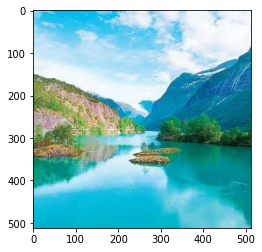

In [ ]:
validation_img = np.array([load_image('/content/Take_in_the_Scenery.jpg', IMG_SIZE)])
plt.imshow(validation_img[0])

In [ ]:
import random
random.seed(0)
total_images.sort()
random.shuffle(total_images)

In [ ]:
total_images[0:10]

In [ ]:
def prepare_stylized_image(imgs):
    return np.clip(imgs, 0, 255).astype(np.uint8)

In [ ]:
#Change n (Initially 1, then 2,3.....)

images = []
n = 6
i = (n-1)*3200
while len(images)!= 3200:
  print(i)
  img = cv2.imread(total_images[i])
  if (img is not None):
    images.append(load_image(total_images[i],IMG_SIZE))
  i = i+1




In [ ]:
len(images)

3200

In [ ]:
train_images = []

file_names = images
n = len(file_names)//BATCH_SIZE
for it in range(n):
  start = it * BATCH_SIZE
  end = (it + 1) * BATCH_SIZE
  train_images.append(images[start:end])


In [ ]:
len(train_images)

400

In [ ]:
TO_TRAIN = True

In [ ]:
#Change n
n = 6

# Training

2021-09-17 11:54:50.198048 It: 400 out of 800	loss: 1884.138427734375
INFO:tensorflow:Assets written to: models/model-400.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


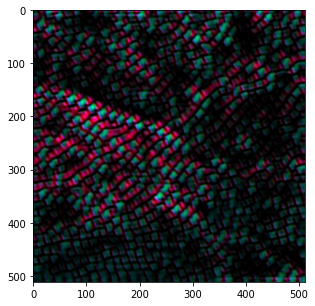

2021-09-17 12:38:56.467316 It: 450 out of 800	loss: 1788.3365478515625
INFO:tensorflow:Assets written to: models/model-450.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


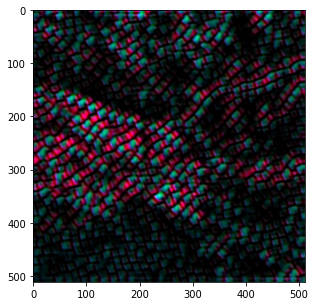

2021-09-17 13:23:47.386785 It: 500 out of 800	loss: 1819.5013427734375
INFO:tensorflow:Assets written to: models/model-500.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


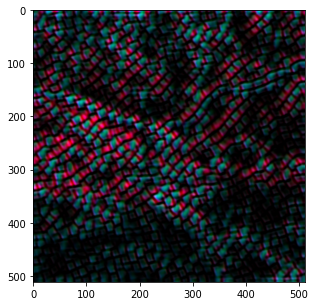

2021-09-17 14:09:14.277571 It: 550 out of 800	loss: 1716.17578125
INFO:tensorflow:Assets written to: models/model-550.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


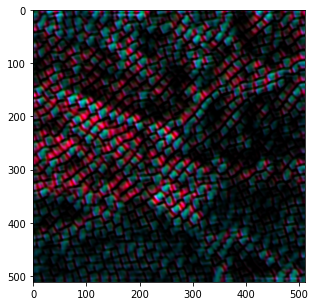

2021-09-17 14:54:54.771711 It: 600 out of 800	loss: 1672.3914794921875
INFO:tensorflow:Assets written to: models/model-600.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


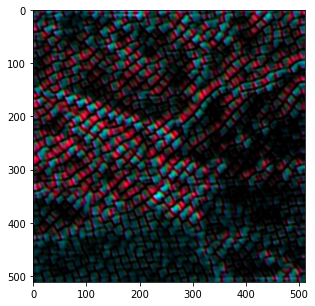

2021-09-17 15:40:42.863175 It: 650 out of 800	loss: 1675.01318359375
INFO:tensorflow:Assets written to: models/model-650.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


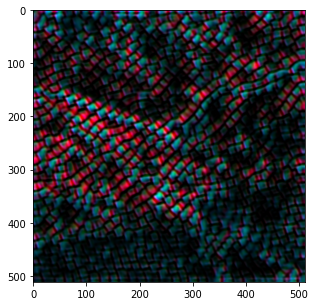

2021-09-17 16:27:15.361683 It: 700 out of 800	loss: 1800.5792236328125
INFO:tensorflow:Assets written to: models/model-700.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


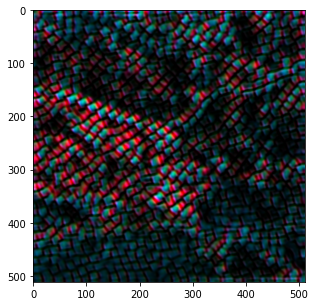

2021-09-17 17:13:31.134345 It: 750 out of 800	loss: 1660.500732421875
INFO:tensorflow:Assets written to: models/model-750.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


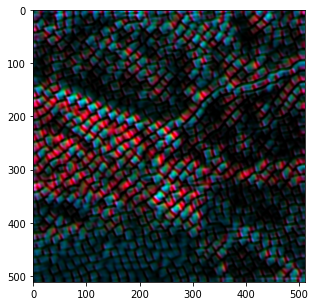

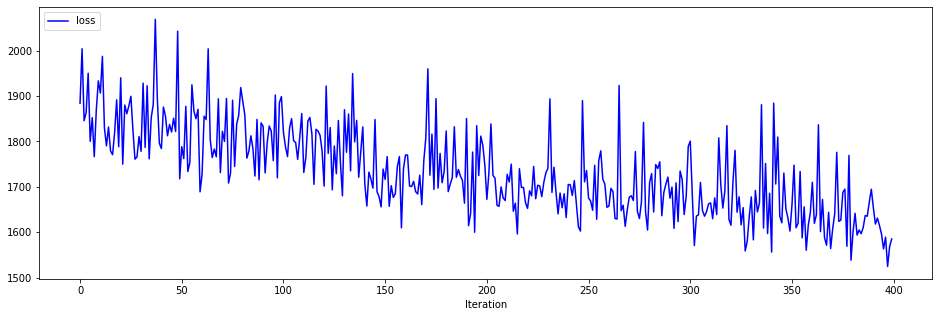

In [ ]:
if TO_TRAIN:
    losses = []
    file_names = images
    plt.rcParams["figure.figsize"] = (16, 5) # (w, h)
    with open("loss.txt", "w", encoding="utf-8") as f:
        for it in range((n-1)*400,((n-1)*400)+400):
            samples = np.array(train_images[it- (n-1)*400])
            loss = stylizer.train_on_batch(samples, samples)
            losses.append(loss)

            if it % 50 == 0:
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                text = f'{datetime.datetime.now()} It: {it} out of {((n-1)*400)+400}\tloss: {loss}'
                f.write(text + '\n')
                print(text)
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                stylizer.save(f"models/model-{it}.ckpt")
                pred = stylizer.predict(validation_img)[0]
                pred = prepare_stylized_image(pred)
                plt.imshow(pred)
                plt.show()
    
    plt.plot(losses, '-b', label='loss')

    plt.xlabel("Loss")
    plt.xlabel("Iteration")
    plt.legend(loc='upper left')

    plt.savefig("loss.png")
    plt.show()

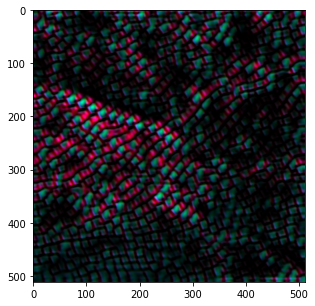

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()

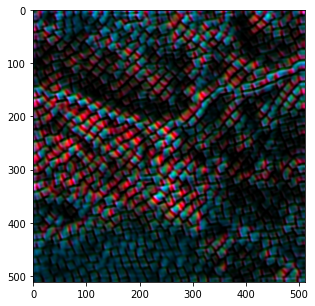

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()

2021-09-19 10:58:23.521050 It: 800 out of 1200	loss: 1610.47216796875
INFO:tensorflow:Assets written to: models/model-800.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


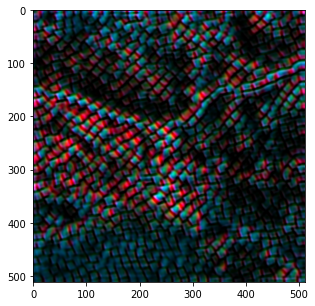

2021-09-19 11:43:55.911471 It: 850 out of 1200	loss: 1530.1279296875
INFO:tensorflow:Assets written to: models/model-850.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


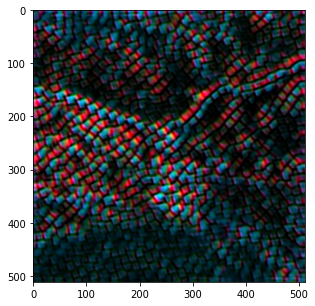

2021-09-19 12:30:50.969136 It: 900 out of 1200	loss: 1671.9210205078125
INFO:tensorflow:Assets written to: models/model-900.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


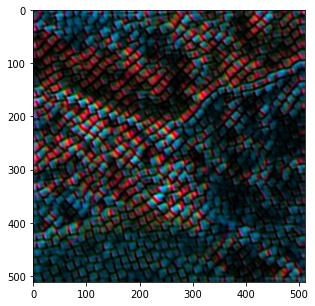

2021-09-19 13:17:40.527379 It: 950 out of 1200	loss: 1698.884765625
INFO:tensorflow:Assets written to: models/model-950.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


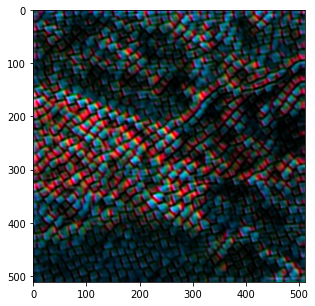

2021-09-19 14:04:40.759785 It: 1000 out of 1200	loss: 1620.232666015625
INFO:tensorflow:Assets written to: models/model-1000.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


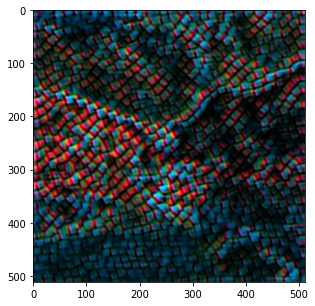

2021-09-19 14:52:04.213624 It: 1050 out of 1200	loss: 1654.638671875
INFO:tensorflow:Assets written to: models/model-1050.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


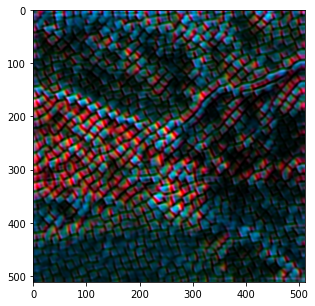

2021-09-19 15:39:37.194698 It: 1100 out of 1200	loss: 1552.714111328125
INFO:tensorflow:Assets written to: models/model-1100.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


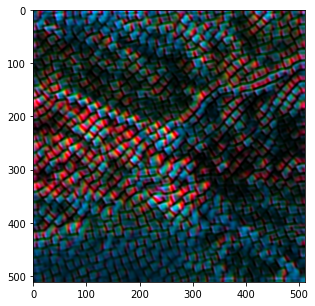

2021-09-19 16:27:45.669104 It: 1150 out of 1200	loss: 1552.67138671875
INFO:tensorflow:Assets written to: models/model-1150.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


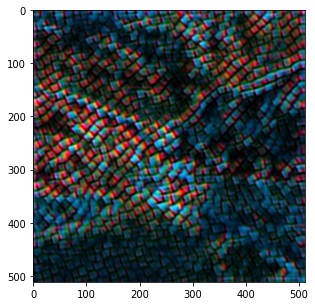

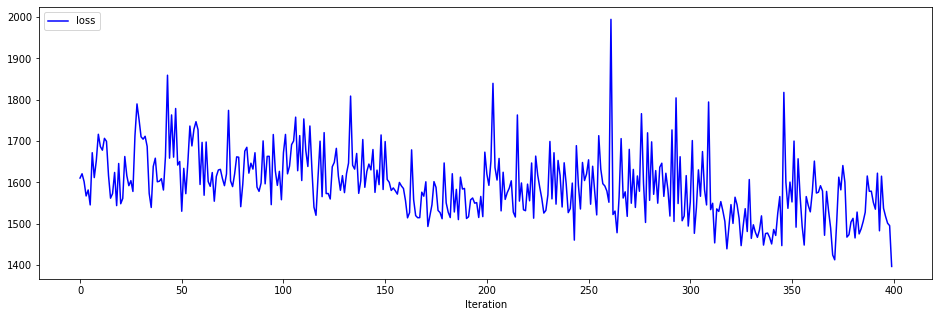

In [ ]:
if TO_TRAIN:
    losses = []
    file_names = images
    plt.rcParams["figure.figsize"] = (16, 5) # (w, h)
    with open("loss.txt", "w", encoding="utf-8") as f:
        for it in range((n-1)*400,((n-1)*400)+400):
            samples = np.array(train_images[it- (n-1)*400])
            loss = stylizer.train_on_batch(samples, samples)
            losses.append(loss)

            if it % 50 == 0:
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                text = f'{datetime.datetime.now()} It: {it} out of {((n-1)*400)+400}\tloss: {loss}'
                f.write(text + '\n')
                print(text)
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                stylizer.save(f"models/model-{it}.ckpt")
                pred = stylizer.predict(validation_img)[0]
                pred = prepare_stylized_image(pred)
                plt.imshow(pred)
                plt.show()
    
    plt.plot(losses, '-b', label='loss')

    plt.xlabel("Loss")
    plt.xlabel("Iteration")
    plt.legend(loc='upper left')

    plt.savefig("loss.png")
    plt.show()

2021-09-20 03:56:32.089795 It: 1200 out of 1600	loss: 1430.8050537109375
INFO:tensorflow:Assets written to: models/model-1200.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


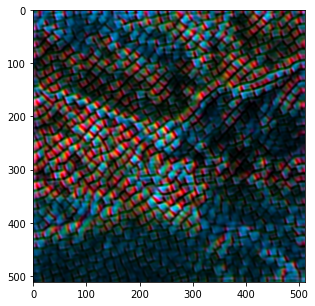

2021-09-20 04:41:26.202769 It: 1250 out of 1600	loss: 1467.9478759765625
INFO:tensorflow:Assets written to: models/model-1250.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


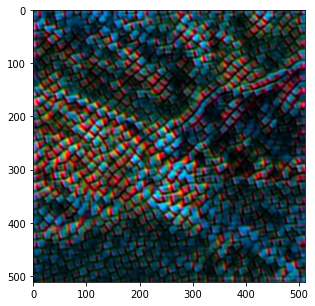

2021-09-20 05:27:01.489851 It: 1300 out of 1600	loss: 1533.4716796875
INFO:tensorflow:Assets written to: models/model-1300.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


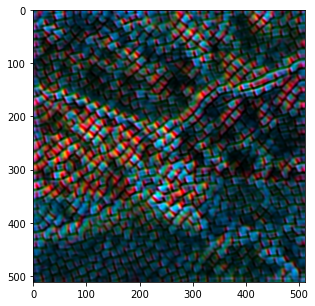

2021-09-20 06:12:42.796849 It: 1350 out of 1600	loss: 1443.710205078125
INFO:tensorflow:Assets written to: models/model-1350.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


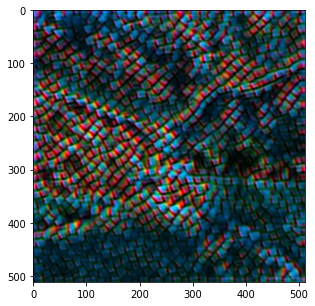

2021-09-20 06:58:41.163794 It: 1400 out of 1600	loss: 1483.1729736328125
INFO:tensorflow:Assets written to: models/model-1400.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


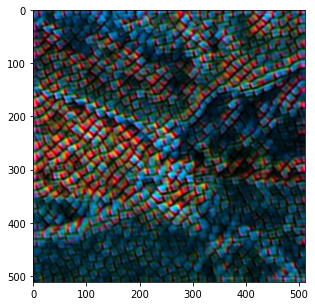

2021-09-20 07:44:11.318650 It: 1450 out of 1600	loss: 1478.908203125
INFO:tensorflow:Assets written to: models/model-1450.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


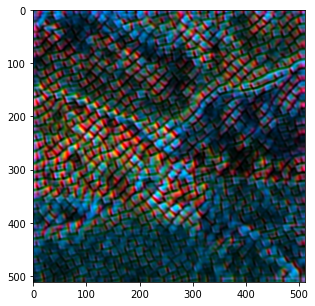

2021-09-20 08:30:29.732202 It: 1500 out of 1600	loss: 1451.3236083984375
INFO:tensorflow:Assets written to: models/model-1500.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


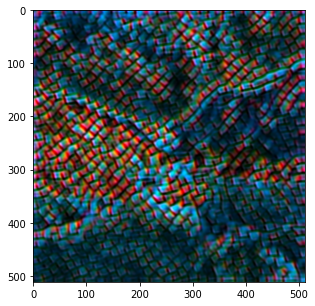

2021-09-20 09:16:14.852452 It: 1550 out of 1600	loss: 1457.5706787109375
INFO:tensorflow:Assets written to: models/model-1550.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


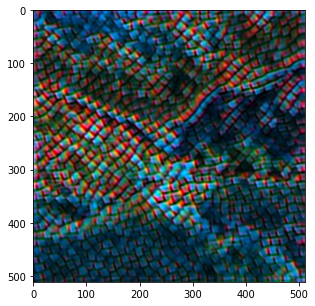

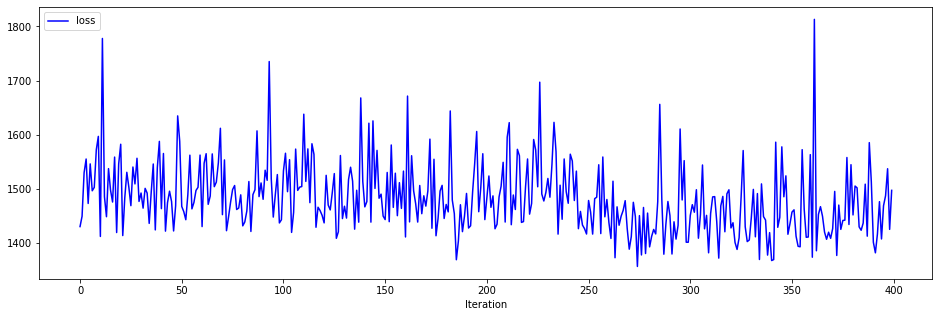

In [ ]:
if TO_TRAIN:
    losses = []
    file_names = images
    plt.rcParams["figure.figsize"] = (16, 5) # (w, h)
    with open("loss.txt", "w", encoding="utf-8") as f:
        for it in range((n-1)*400,((n-1)*400)+400):
            samples = np.array(train_images[it- (n-1)*400])
            loss = stylizer.train_on_batch(samples, samples)
            losses.append(loss)

            if it % 50 == 0:
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                text = f'{datetime.datetime.now()} It: {it} out of {((n-1)*400)+400}\tloss: {loss}'
                f.write(text + '\n')
                print(text)
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                stylizer.save(f"models/model-{it}.ckpt")
                pred = stylizer.predict(validation_img)[0]
                pred = prepare_stylized_image(pred)
                plt.imshow(pred)
                plt.show()
    
    plt.plot(losses, '-b', label='loss')

    plt.xlabel("Loss")
    plt.xlabel("Iteration")
    plt.legend(loc='upper left')

    plt.savefig("loss.png")
    plt.show()

2021-09-21 04:56:17.081329 It: 1600 out of 2000	loss: 1448.6397705078125
INFO:tensorflow:Assets written to: models/model-1600.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


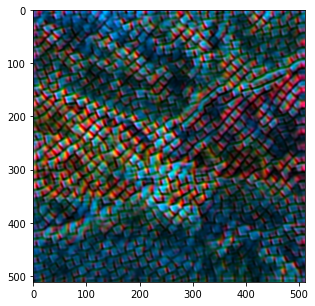

2021-09-21 05:41:40.935566 It: 1650 out of 2000	loss: 1536.4912109375
INFO:tensorflow:Assets written to: models/model-1650.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


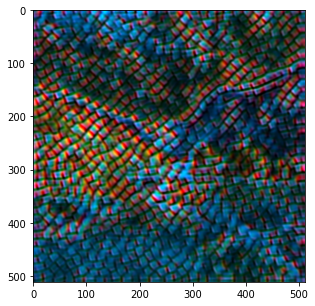

2021-09-21 06:27:56.350877 It: 1700 out of 2000	loss: 1507.905517578125
INFO:tensorflow:Assets written to: models/model-1700.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


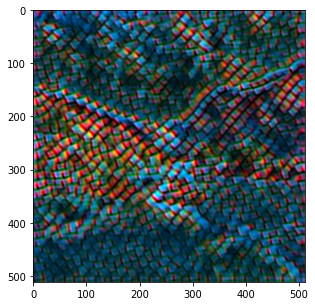

2021-09-21 07:14:22.711957 It: 1750 out of 2000	loss: 1417.7867431640625
INFO:tensorflow:Assets written to: models/model-1750.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


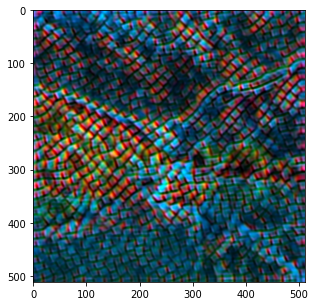

2021-09-21 08:01:18.530669 It: 1800 out of 2000	loss: 1519.6431884765625
INFO:tensorflow:Assets written to: models/model-1800.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


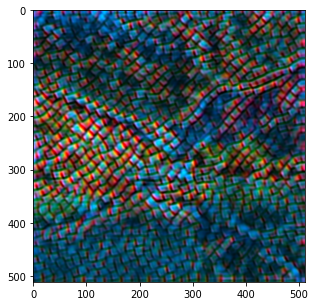

2021-09-21 08:48:25.531494 It: 1850 out of 2000	loss: 1501.081787109375
INFO:tensorflow:Assets written to: models/model-1850.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


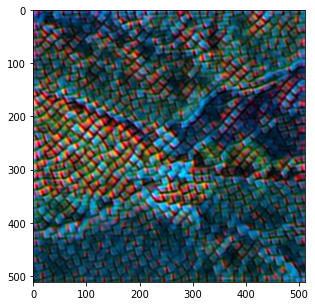

2021-09-21 09:35:32.781202 It: 1900 out of 2000	loss: 1410.769287109375
INFO:tensorflow:Assets written to: models/model-1900.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


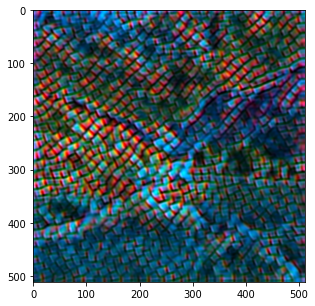

2021-09-21 10:23:19.297099 It: 1950 out of 2000	loss: 1385.530029296875
INFO:tensorflow:Assets written to: models/model-1950.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


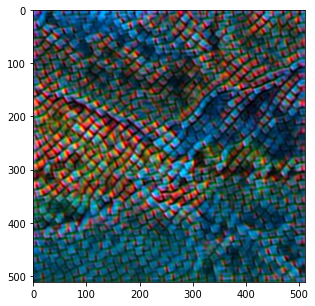

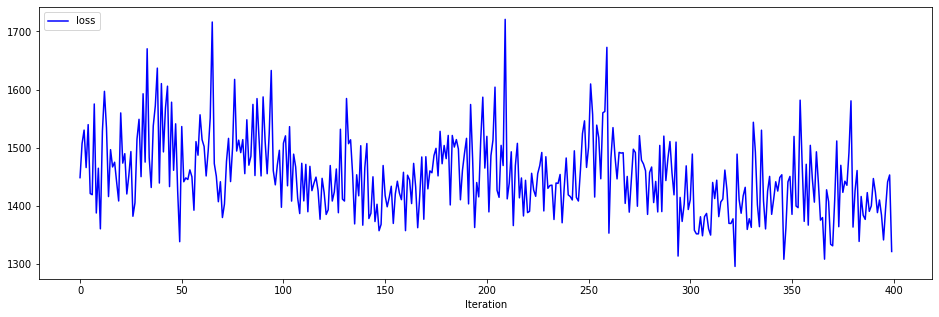

In [ ]:
if TO_TRAIN:
    losses = []
    file_names = images
    plt.rcParams["figure.figsize"] = (16, 5) # (w, h)
    with open("loss.txt", "w", encoding="utf-8") as f:
        for it in range((n-1)*400,((n-1)*400)+400):
            samples = np.array(train_images[it- (n-1)*400])
            loss = stylizer.train_on_batch(samples, samples)
            losses.append(loss)

            if it % 50 == 0:
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                text = f'{datetime.datetime.now()} It: {it} out of {((n-1)*400)+400}\tloss: {loss}'
                f.write(text + '\n')
                print(text)
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                stylizer.save(f"models/model-{it}.ckpt")
                pred = stylizer.predict(validation_img)[0]
                pred = prepare_stylized_image(pred)
                plt.imshow(pred)
                plt.show()
    
    plt.plot(losses, '-b', label='loss')

    plt.xlabel("Loss")
    plt.xlabel("Iteration")
    plt.legend(loc='upper left')

    plt.savefig("loss.png")
    plt.show()

2021-09-23 04:36:39.494022 It: 2000 out of 2400	loss: 1333.6339111328125
INFO:tensorflow:Assets written to: models/model-2000.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


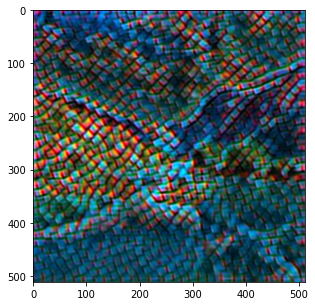

2021-09-23 05:22:40.971086 It: 2050 out of 2400	loss: 1475.4140625
INFO:tensorflow:Assets written to: models/model-2050.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


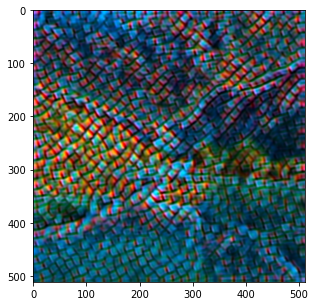

2021-09-23 06:09:03.260079 It: 2100 out of 2400	loss: 1401.9300537109375
INFO:tensorflow:Assets written to: models/model-2100.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


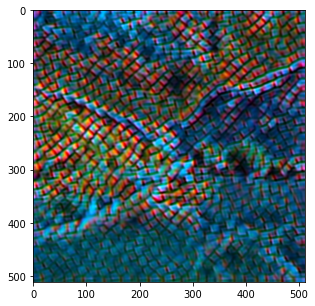

2021-09-23 06:59:26.125693 It: 2150 out of 2400	loss: 1323.1181640625
INFO:tensorflow:Assets written to: models/model-2150.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


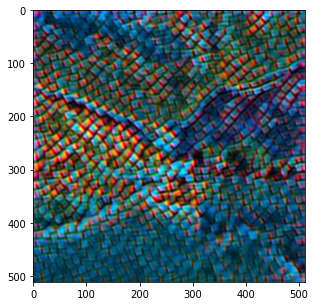

2021-09-23 07:51:57.309319 It: 2200 out of 2400	loss: 1371.8582763671875
INFO:tensorflow:Assets written to: models/model-2200.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


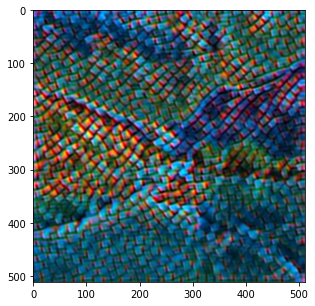

2021-09-23 08:43:07.294570 It: 2250 out of 2400	loss: 1427.1607666015625
INFO:tensorflow:Assets written to: models/model-2250.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


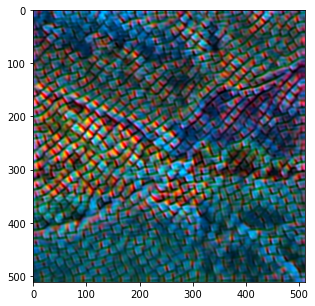

2021-09-23 09:33:29.773001 It: 2300 out of 2400	loss: 1312.950927734375
INFO:tensorflow:Assets written to: models/model-2300.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


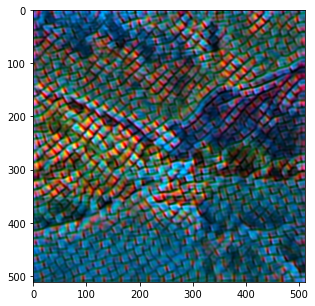

2021-09-23 10:22:39.917859 It: 2350 out of 2400	loss: 1296.963623046875
INFO:tensorflow:Assets written to: models/model-2350.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


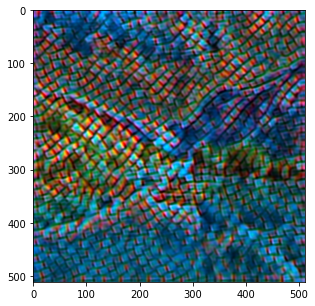

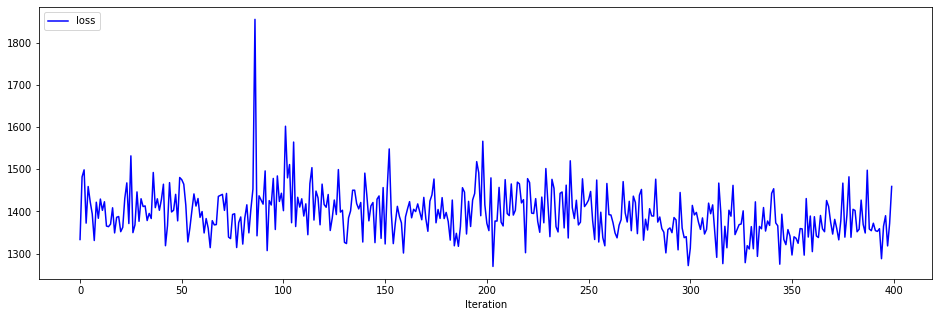

In [ ]:
if TO_TRAIN:
    losses = []
    file_names = images
    plt.rcParams["figure.figsize"] = (16, 5) # (w, h)
    with open("loss.txt", "w", encoding="utf-8") as f:
        for it in range((n-1)*400,((n-1)*400)+400):
            samples = np.array(train_images[it- (n-1)*400])
            loss = stylizer.train_on_batch(samples, samples)
            losses.append(loss)

            if it % 50 == 0:
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                text = f'{datetime.datetime.now()} It: {it} out of {((n-1)*400)+400}\tloss: {loss}'
                f.write(text + '\n')
                print(text)
                #Change 0 to whatever iteration you have started from (0,200,400,...)
                stylizer.save(f"models/model-{it}.ckpt")
                pred = stylizer.predict(validation_img)[0]
                pred = prepare_stylized_image(pred)
                plt.imshow(pred)
                plt.show()
    
    plt.plot(losses, '-b', label='loss')

    plt.xlabel("Loss")
    plt.xlabel("Iteration")
    plt.legend(loc='upper left')

    plt.savefig("loss.png")
    plt.show()

In [ ]:
#Change the style to the style and number to iterations completed

model = 'artstyletransfer-mosaic512-1200.ckpt'
stylizer.save(model)

INFO:tensorflow:Assets written to: artstyletransfer-mosaic512-1200.ckpt/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [ ]:
#Change the style to the style and number to iterations completed
!zip -r "/content/artstyletransfer-mosaic512-1200.zip" "/content/artstyletransfer-mosaic512-1200.ckpt"

  adding: content/artstyletransfer-mosaic512-1200.ckpt/ (stored 0%)
  adding: content/artstyletransfer-mosaic512-1200.ckpt/variables/ (stored 0%)
  adding: content/artstyletransfer-mosaic512-1200.ckpt/variables/variables.index (deflated 79%)
  adding: content/artstyletransfer-mosaic512-1200.ckpt/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: content/artstyletransfer-mosaic512-1200.ckpt/assets/ (stored 0%)
  adding: content/artstyletransfer-mosaic512-1200.ckpt/saved_model.pb (deflated 92%)
  adding: content/artstyletransfer-mosaic512-1200.ckpt/keras_metadata.pb (deflated 94%)


In [ ]:
files.download("/content/artstyletransfer-mosaic512-1200.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Results

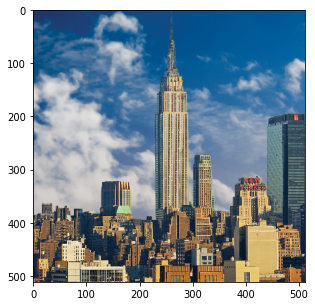

In [ ]:
validation_img = np.array([load_image('/content/Midtown-Manhattan-Empire-State-Building-New-York.jpg', IMG_SIZE)])
plt.imshow(validation_img[0])

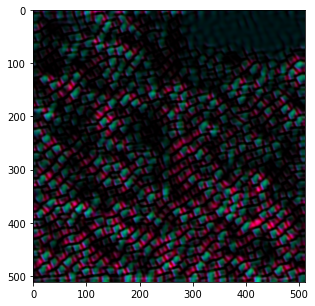

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()

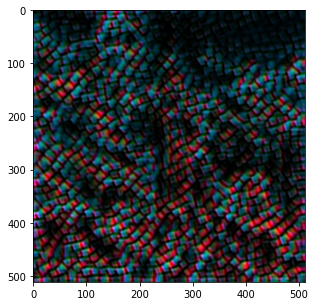

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()

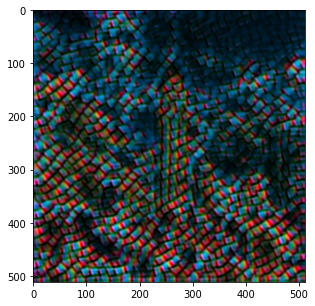

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()

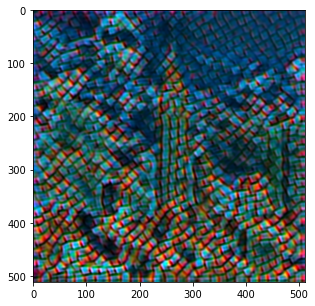

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()

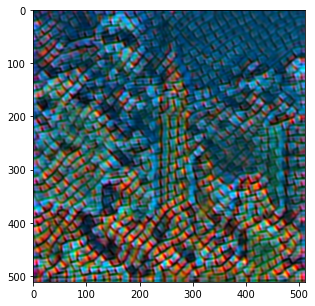

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()

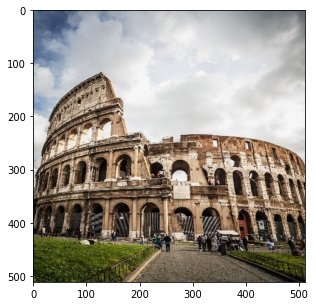

In [ ]:
validation_img = np.array([load_image('/content/Colloseum.jpg', IMG_SIZE)])
plt.imshow(validation_img[0])

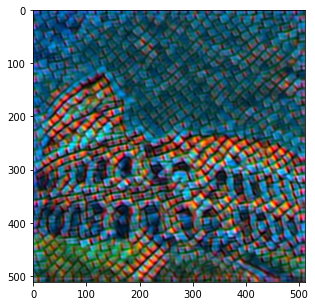

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()

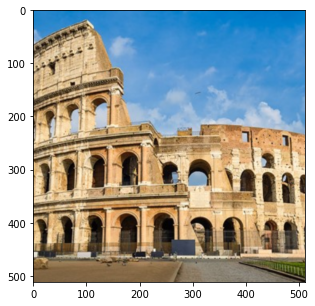

In [ ]:
validation_img = np.array([load_image('/content/Colloseum2.jpg', IMG_SIZE)])
plt.imshow(validation_img[0])

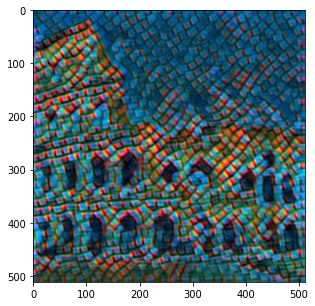

In [ ]:
pred = stylizer.predict(validation_img)[0]
pred = prepare_stylized_image(pred)
plt.imshow(pred)
plt.show()